# easyshader: Examples

easyshader is a tool for rendering 3D scenes, exporting .ply files for 3D printing and creating animations, powered by Signed Distance Fields (SDFs) and written in Python/Taichi.

It was created to enable drawing 3D shapes using a very concise syntax, and is packed with 3D primitives, transformations and smooth operators.

[![Run in Google Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/marceloprates/easyshader/blob/main/README.ipynb)

<img src="pictures/logo.png" width="25%">


# Basic usage

In [ ]:
# If you're running this from Google Colab or you simply don't have easyshader installed, you can install it by running:
#%pip install git+https://github.com/marceloprates/easyshader
from easyshader import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


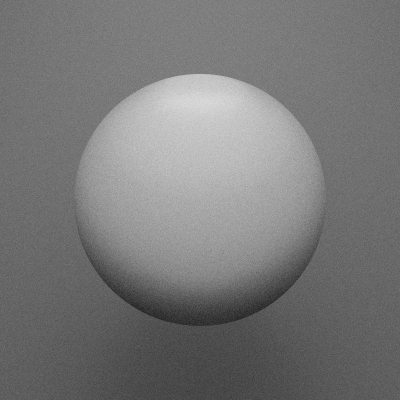

In [3]:
Sphere(1)

Use the "color" parameter to paint your object

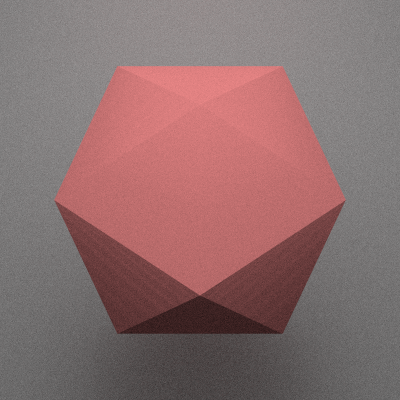

In [4]:
Icosahedron(1,'#f55')

# easyshader primitives

You can choose from the following primitives:

- Box
- BoxFrame
- Callable
- Cone
- Cyllinder
- Icosahedron
- Iterable
- Line
- Number
- Octahedron
- Shape
- Sphere
- Torus

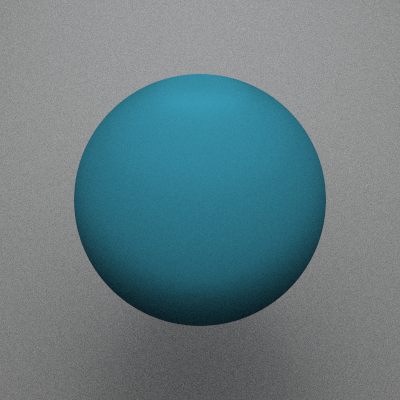

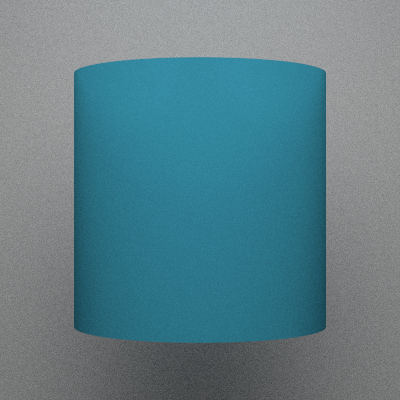

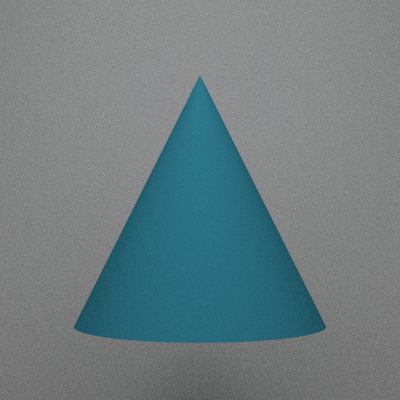

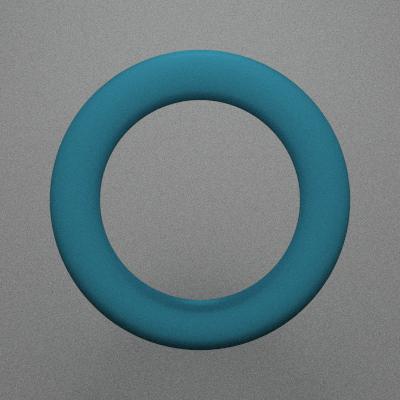

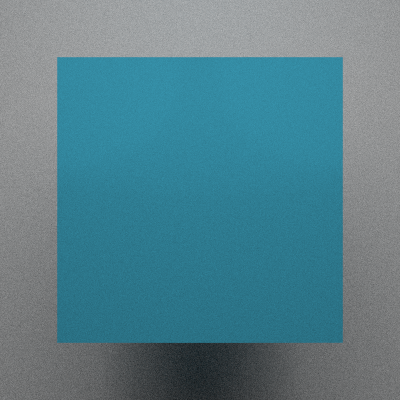

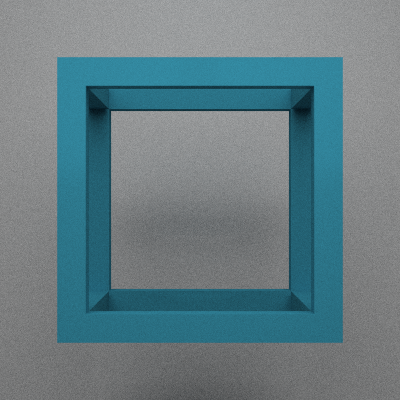

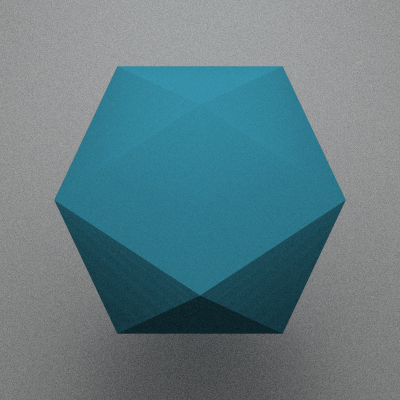

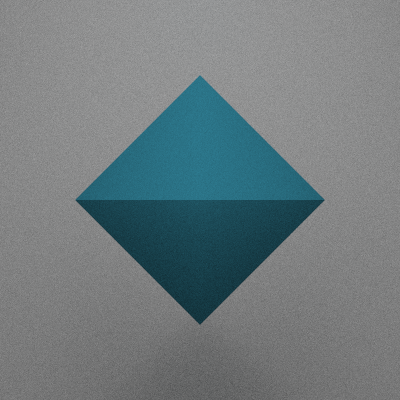

In [5]:
for obj in [Sphere(1), Cyllinder(1,1), Cone(1,2), Torus(1,.2), Box(1), BoxFrame(1,.1), Icosahedron(1), Octahedron(1)]:
    display(obj.paint('#0B4F6C'))

# Exporting to .ply for usage in Blender or 3D printing

Export your creations to polygon meshes for 3d printing or rendering on external apps (e.g. Blender)

In [6]:
#Icosahedron(1).to_mesh(simplify = 20, save_path='icosahedron.ply')

Color your creations using functions defined over x,y,z and a color palette:

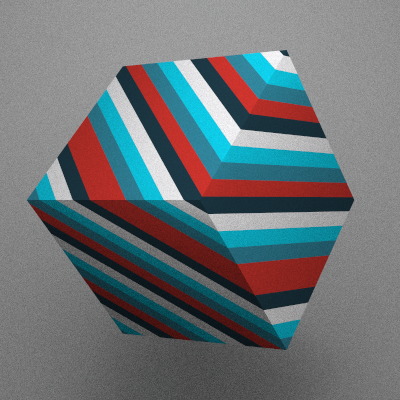

In [38]:
palette = ['#B80C09','#0B4F6C','#01BAEF','#FBFBFF','#040F16']

x = Box(.8,'palette(6*(x+y+z))',palette = palette)
x = x.isometric()

x

# Binary operations

## Union:

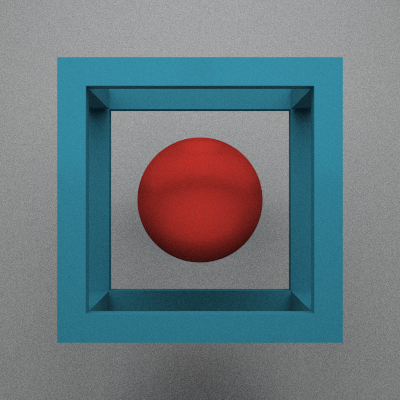

In [8]:
BoxFrame(1,.1,'#0B4F6C') + Sphere(.5,'#B80C09')

## Difference:

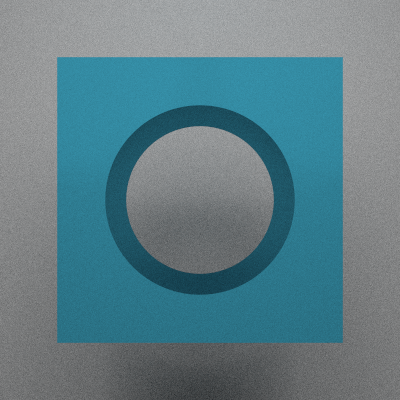

In [9]:
Box(1,'#0B4F6C') - Sphere(1.2)

## Intersection:

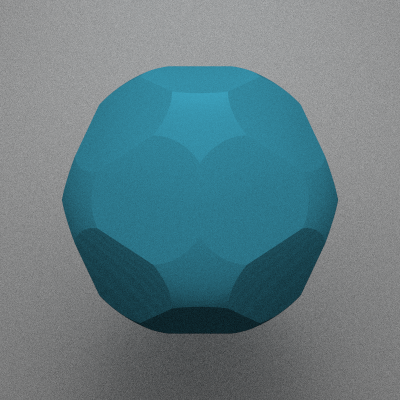

In [10]:
Icosahedron(1,'#0B4F6C') & Sphere(1.1)

# Examples

## A coffee cup!

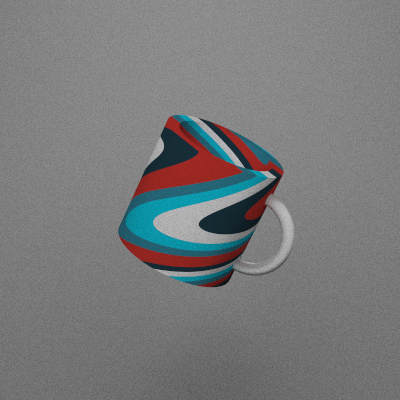

In [11]:
x = Sphere(1, 'palette(6*(x+y+z))', palette = palette)
x = x.twist(4)

x &= Cyllinder(.5,.5)
x -= Cyllinder(.4,.5) + 'dy .1'
x += (Torus(.3,.05) & Shape('-x')) + 'dx .5'
x = x.isometric()
x += 'rx -pi/3'

x

# Create videos!
Use the 't' (time) variable to control the animation

Animating..: 100%|██████████| 59/59 [08:59<00:00,  9.14s/it]


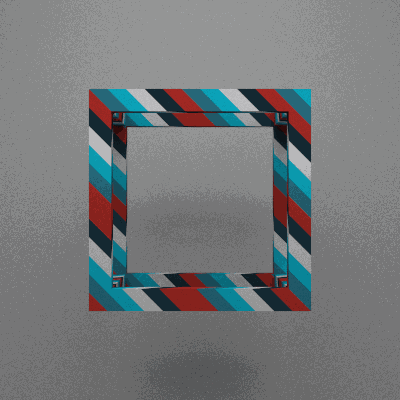

In [39]:
x = BoxFrame(1,.1,'palette(6*t + 6*(x+y+z))',palette = palette)
x += '.1*sin(t)'
x += 'ry t'
x += 'rx t'

x.animate(frames = 60, framerate = 15, iterations = 1000)

# Transformations

## Translation

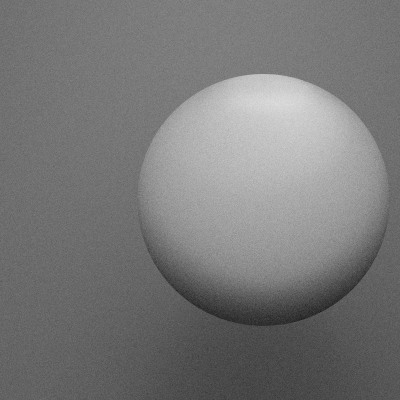

In [40]:
Sphere(1) + 'dx .5'

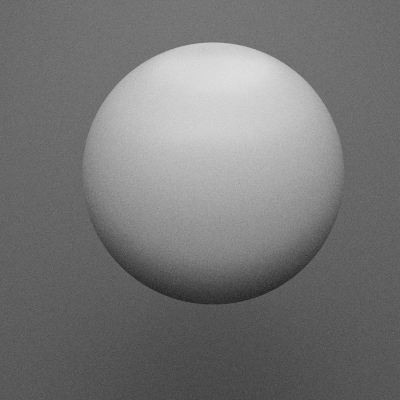

In [41]:
Sphere(1) + '(.1,.2,.3)'

## Scale

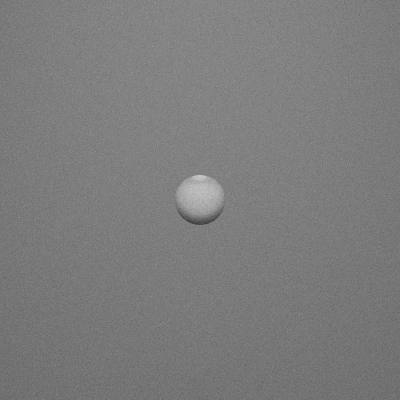

In [42]:
Sphere(1) * .2

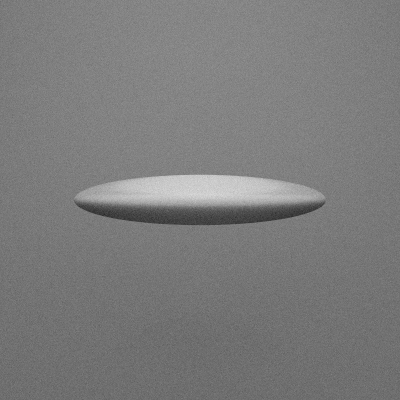

In [43]:
Sphere(1) * (1,.2,1)

## Rotation

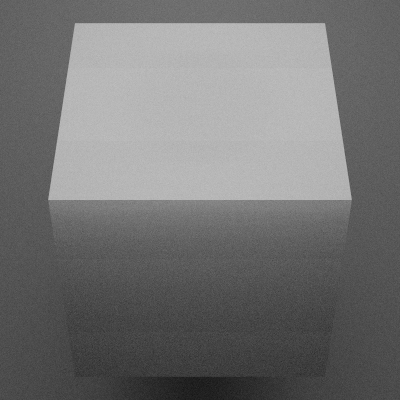

In [44]:
Box(1) + 'rx pi/4'

## Advanced transformations

You can use x,y,z (and the time parameter, t) as variables in transformations such as translation, rotation, scale

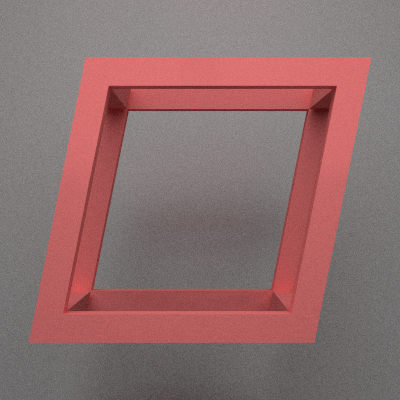

In [45]:
BoxFrame(1,.1,'#f44') + 'dx .2*y'

# Other operations

## Twist along an axis

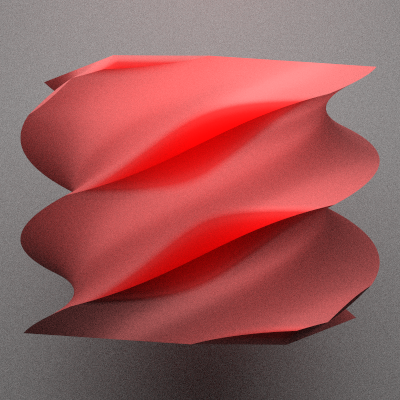

In [46]:
Box(1,'#f44').twist(2,'y')

## Create an "onion" shape

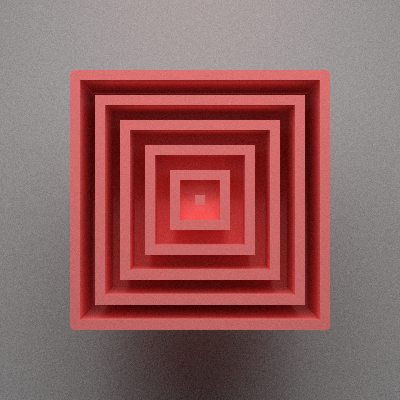

In [47]:
# Create an onion from a box
x = Box(1,'#f44').onion()
# Cut a hole in the onion
x &= Shape('z')

x

# Smooth operators

## Smooth union

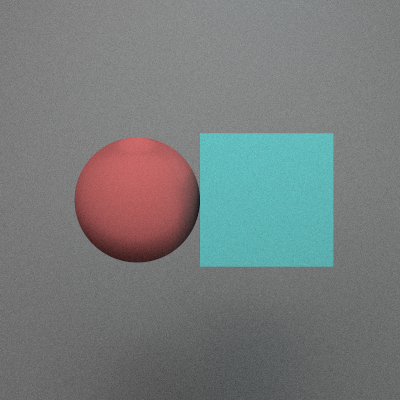

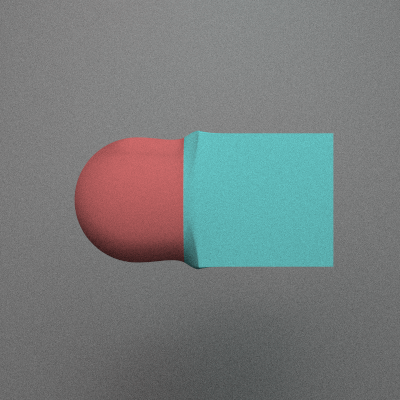

In [48]:
sphere = (Sphere(.5,'#f44') + 'dx -.5')
box = (Box(.5,'#4ff') + 'dx +.5')

# Normal union
display(sphere + box)

# Smooth union
display(sphere <<su(.5)>> box)

## Smooth difference

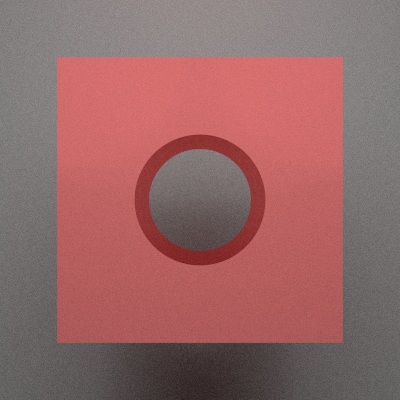

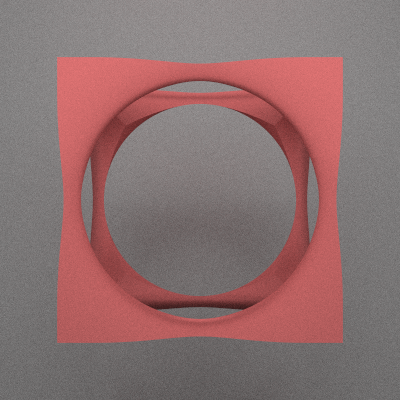

In [49]:
sphere = Sphere(1.1)
box = Box(1,'#f44')

# Normal difference
display(box - sphere)

# Smooth difference
display(box <<sd(.5)>> sphere)

## Smooth intersection

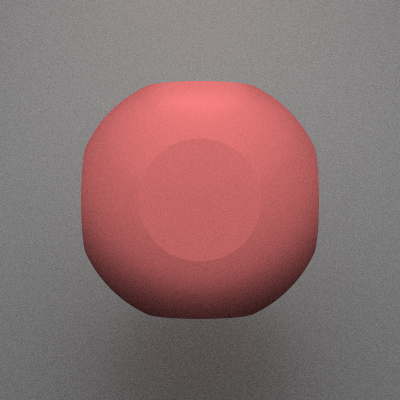

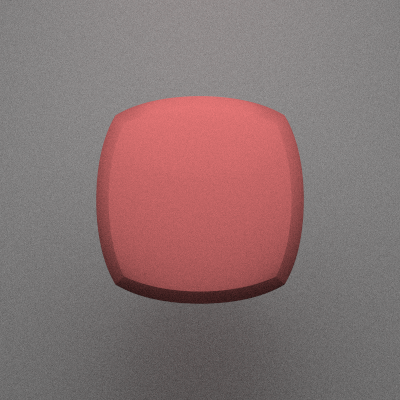

In [50]:
sphere = Sphere(1)
box = Box(.9,'#f44')

# Normal intersection
display(box & sphere)

# Smooth intersection
display(box <<si(.5)>> sphere)

# Use custom taichi functions!

In [51]:
'''
from easyshader import *

@ti.func
def mandelbulb_fn(p,max_it,k):
    z, dr, r = p, 1., 0.
    for i in range(max_it):
        r, steps = z.norm(), i
        if r > 4.0: break;
        # convert to polar coordinates
        theta = ti.acos(z.z/r)
        phi = ti.atan2(z.y,z.x)
        dr = r**2 * 3 * dr + 1.0
        # scale and rotate the point
        zr = r**3
        theta = theta*3
        phi = phi*3
        # convert back to cartesian coordinates
        z = zr*ti.Vector([
            ti.sin(theta)*ti.cos(phi),
            ti.sin(phi)*ti.sin(theta),
            ti.cos(theta)
        ])
        z+=p
    out = ti.log(r)*r/dr
    if k==1:
        out = r
    return out

# Create mandelbulb shape
mandelbulb = Shape(
    # Call 'mandelbulb_fn' to compute the SDF
    sdf = '.2*mandelbulb_fn(p,10,0)',
    #color = 'palette(200*mandelbulb_fn(1.1*p))',
    color = 'palette(12*mandelbulb_fn(p,10,1))',
    palette = ['#0C0F0A', '#FBFF12', '#FF206E', '#41EAD4', '#FFFFFF'],
    # Pass 'mandelbulb_fn' as a keyword argument
    mandelbulb_fn = mandelbulb_fn,
)

mandelbulb = mandelbulb.isometric()

mandelbulb.render(
    resolution = (2480,3508),
    fov = .25,
    max_raymarch_steps = 200,
    iterations = 1000,
        verbose = True
)'''

"\nfrom easyshader import *\n\n@ti.func\ndef mandelbulb_fn(p,max_it,k):\n    z, dr, r = p, 1., 0.\n    for i in range(max_it):\n        r, steps = z.norm(), i\n        if r > 4.0: break;\n        # convert to polar coordinates\n        theta = ti.acos(z.z/r)\n        phi = ti.atan2(z.y,z.x)\n        dr = r**2 * 3 * dr + 1.0\n        # scale and rotate the point\n        zr = r**3\n        theta = theta*3\n        phi = phi*3\n        # convert back to cartesian coordinates\n        z = zr*ti.Vector([\n            ti.sin(theta)*ti.cos(phi),\n            ti.sin(phi)*ti.sin(theta),\n            ti.cos(theta)\n        ])\n        z+=p\n    out = ti.log(r)*r/dr\n    if k==1:\n        out = r\n    return out\n\n# Create mandelbulb shape\nmandelbulb = Shape(\n    # Call 'mandelbulb_fn' to compute the SDF\n    sdf = '.2*mandelbulb_fn(p,10,0)',\n    #color = 'palette(200*mandelbulb_fn(1.1*p))',\n    color = 'palette(12*mandelbulb_fn(p,10,1))',\n    palette = ['#0C0F0A', '#FBFF12', '#FF206E', '#